In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/open-images-v4-data/train-annotations-human-imagelabels-boxable.csv
/kaggle/input/open-images-v4-data/challenge-2018-train-vrd.csv
/kaggle/input/open-images-v4-data/train-images-boxable-with-rotation.csv
/kaggle/input/open-images-v4-data/train-annotations-bbox.csv


In [3]:
import pandas as pd

# File paths
files = {
    "Train Annotations Human Image Labels Boxable": "/kaggle/input/open-images-v4-data/train-annotations-human-imagelabels-boxable.csv",
    "Challenge 2018 Train VRD": "/kaggle/input/open-images-v4-data/challenge-2018-train-vrd.csv",
    "Train Images Boxable with Rotation": "/kaggle/input/open-images-v4-data/train-images-boxable-with-rotation.csv",
    "Train Annotations Bounding Box": "/kaggle/input/open-images-v4-data/train-annotations-bbox.csv"
}

# Load and inspect each file
for name, path in files.items():
    print(f"Loading: {name}")
    df = pd.read_csv(path)
    print(f"Columns in {name}:\n{df.columns}\n")
    print(f"First few rows of {name}:\n{df.head()}\n")


Loading: Train Annotations Human Image Labels Boxable
Columns in Train Annotations Human Image Labels Boxable:
Index(['ImageID', 'Source', 'LabelName', 'Confidence'], dtype='object')

First few rows of Train Annotations Human Image Labels Boxable:
            ImageID        Source  LabelName  Confidence
0  000002b66c9c498e  verification  /m/014j1m           0
1  000002b66c9c498e  verification  /m/014sv8           1
2  000002b66c9c498e  verification   /m/01599           0
3  000002b66c9c498e  verification   /m/015p6           0
4  000002b66c9c498e  verification  /m/015x4r           0

Loading: Challenge 2018 Train VRD
Columns in Challenge 2018 Train VRD:
Index(['ImageID', 'LabelName1', 'LabelName2', 'XMin1', 'XMax1', 'YMin1',
       'YMax1', 'XMin2', 'XMax2', 'YMin2', 'YMax2', 'RelationshipLabel'],
      dtype='object')

First few rows of Challenge 2018 Train VRD:
            ImageID  LabelName1 LabelName2    XMin1     XMax1     YMin1  \
0  fe58ec1b06db2bb7   /m/04bcr3   /m/083vt  0.005

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


Columns in Train Annotations Bounding Box:
Index(['ImageID', 'Source', 'LabelName', 'Confidence', 'XMin', 'XMax', 'YMin',
       'YMax', 'IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction',
       'IsInside'],
      dtype='object')

First few rows of Train Annotations Bounding Box:
            ImageID  Source  LabelName  Confidence      XMin      XMax  \
0  000002b66c9c498e  xclick  /m/01g317           1  0.012500  0.195312   
1  000002b66c9c498e  xclick  /m/01g317           1  0.025000  0.276563   
2  000002b66c9c498e  xclick  /m/01g317           1  0.151562  0.310937   
3  000002b66c9c498e  xclick  /m/01g317           1  0.256250  0.429688   
4  000002b66c9c498e  xclick  /m/01g317           1  0.257812  0.346875   

       YMin      YMax  IsOccluded  IsTruncated  IsGroupOf  IsDepiction  \
0  0.148438  0.587500           0            1          0            0   
1  0.714063  0.948438           0            1          0            0   
2  0.198437  0.590625           1            0

In [9]:
images_data = pd.read_csv("/kaggle/input/open-images-v4-data/train-images-boxable-with-rotation.csv")
print(images_data.shape)
images_data.head()

(1743042, 12)


/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
0,4fa8054781a4c382,train,https://farm3.staticflickr.com/5310/5898076654...,https://www.flickr.com/photos/michael-beat/589...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/michael-beat/,Michael Beat,...die FNF-Kerze,4405052,KFukvivpCM5QXl5SqKe41g==,https://c1.staticflickr.com/6/5310/5898076654_...,0.0
1,b37f763ae67d0888,train,https://c1.staticflickr.com/1/67/197493648_628...,https://www.flickr.com/photos/drstarbuck/19749...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/drstarbuck/,Karen,Three boys on a hill,494555,9IzEn38GRNsVpATuv7gzEA==,https://c3.staticflickr.com/1/67/197493648_628...,0.0
2,7e8584b0f487cb9e,train,https://c7.staticflickr.com/8/7056/7143870979_...,https://www.flickr.com/photos/circasassy/71438...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/circasassy/,CircaSassy,A Christmas carol and The cricket on the heart...,2371584,3hQwu0iSzY1VIoXiwp0/Mg==,https://c7.staticflickr.com/8/7056/7143870979_...,0.0
3,86638230febe21c4,train,https://farm5.staticflickr.com/5128/5301868579...,https://www.flickr.com/photos/ajcreencia/53018...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/ajcreencia/,Alex,Abbey and Kenny,949267,onB+rCZnGQg5PRX7xOs18Q==,https://c4.staticflickr.com/6/5128/5301868579_...,NaN
4,249086e72671397d,train,https://c6.staticflickr.com/4/3930/15342460029...,https://www.flickr.com/photos/codnewsroom/1534...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/codnewsroom/,COD Newsroom,Suburban Law Enforcement Academy 20th Annivers...,6541758,MjpaAVbMAWbCusSaxI1D7w==,https://c1.staticflickr.com/4/3930/15342460029...,0.0


In [8]:
relations_data = pd.read_csv("/kaggle/input/open-images-v4-data/challenge-2018-train-vrd.csv")

print(relations_data.shape)
relations_data.head()

(374768, 12)


,ImageID,LabelName1,LabelName2,XMin1,XMax1,YMin1,YMax1,XMin2,XMax2,YMin2,YMax2,RelationshipLabel
0,fe58ec1b06db2bb7,/m/04bcr3,/m/083vt,0.00500,0.033125,0.580000,0.627778,0.00500,0.033125,0.580000,0.627778,is
1,82d16a22f703df5c,/m/04dr76w,/m/02gy9n,0.61200,0.735000,0.418919,0.950450,0.61200,0.735000,0.418919,0.950450,is
2,b54d41beabcfd900,/m/01mzpv,/m/083vt,0.37250,0.399375,0.706413,0.778557,0.37250,0.399375,0.706413,0.778557,is
3,4b6a08cc110d7275,/m/01mzpv,/m/01y9k5,0.17125,0.255625,0.557500,0.749167,0.20750,0.683125,0.611667,0.999167,at
4,0144cfbb726f4c72,/m/01mzpv,/m/04bcr3,0.85500,0.950000,0.561667,0.609167,0.82875,0.999375,0.568333,0.673333,at


In [10]:
annotations_data = pd.read_csv("/kaggle/input/open-images-v4-data/train-annotations-bbox.csv")

print(annotations_data.shape)
annotations_data.head()

(14610229, 13)


,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,000002b66c9c498e,xclick,/m/01g317,1,0.012500,0.195312,0.148438,0.587500,0,1,0,0,0
1,000002b66c9c498e,xclick,/m/01g317,1,0.025000,0.276563,0.714063,0.948438,0,1,0,0,0
2,000002b66c9c498e,xclick,/m/01g317,1,0.151562,0.310937,0.198437,0.590625,1,0,0,0,0
3,000002b66c9c498e,xclick,/m/01g317,1,0.256250,0.429688,0.651563,0.925000,1,0,0,0,0
4,000002b66c9c498e,xclick,/m/01g317,1,0.257812,0.346875,0.235938,0.385938,1,0,0,0,0


In [11]:
imagelables_data = pd.read_csv("/kaggle/input/open-images-v4-data/train-annotations-human-imagelabels-boxable.csv")
print(imagelables_data.shape)
imagelables_data.head()

(8996795, 4)


,ImageID,Source,LabelName,Confidence
0,000002b66c9c498e,verification,/m/014j1m,0
1,000002b66c9c498e,verification,/m/014sv8,1
2,000002b66c9c498e,verification,/m/01599,0
3,000002b66c9c498e,verification,/m/015p6,0
4,000002b66c9c498e,verification,/m/015x4r,0


In [12]:
sub_images_data = images_data.sample(1000)
print(sub_images_data.shape)
sub_images_data.head()

(1000, 12)


/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
38645,333dcae781c1265b,train,https://c4.staticflickr.com/9/8640/15969392906...,https://www.flickr.com/photos/navcent/15969392906,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/navcent/,U.S. Naval Forces Central Command/U.S. Fifth F...,11th MEU_141209-M-QH793-015,396179,uTvy6rK0FYrZcMvhOaLtxg==,https://c2.staticflickr.com/9/8640/15969392906...,0.0
402595,9778b35e82c83844,train,https://farm5.staticflickr.com/4108/5066166082...,https://www.flickr.com/photos/adactio/5066166082,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/adactio/,Jeremy Keith,Nerds!,3725589,C73khkkpoYT6AP5l30uaxQ==,https://c1.staticflickr.com/5/4108/5066166082_...,0.0
71382,8fcc4ff5bf643d79,train,https://c2.staticflickr.com/2/1156/531294376_2...,https://www.flickr.com/photos/guymoll/531294376,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/guymoll/,Guy MOLL,Belmonte,92712,DtWQtkR8g+OWGxQILguXbA==,https://c2.staticflickr.com/2/1156/531294376_4...,NaN
556114,11def30b71a4df3a,train,https://c3.staticflickr.com/7/6181/6122224629_...,https://www.flickr.com/photos/63716007@N05/612...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/63716007@N05/,B,Color,4296810,NkY33MwuQXuL9Ag1+kaH2g==,https://c8.staticflickr.com/7/6181/6122224629_...,0.0
224298,034de5ee12a27204,train,https://farm5.staticflickr.com/2388/2089528031...,https://www.flickr.com/photos/kitkaphotogirl/2...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/kitkaphotogirl/,Christine Majul,Black Mushrooms,203536,jVbP1cYBwmVzoKUDFLHCRg==,https://c6.staticflickr.com/3/2388/2089528031_...,0.0


In [13]:
sampled_image_ids = sub_images_data['ImageID']
filtered_annotations = annotations_data[annotations_data['ImageID'].isin(sampled_image_ids)]
filtered_relations = relations_data[relations_data['ImageID'].isin(sampled_image_ids)]
print(filtered_annotations.shape)
print(filtered_relations.shape)


(8148, 13)
(266, 12)


In [14]:
filtered_annotations.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
13780,000a93fcac30e4c0,activemil,/m/09ddx,1,0.503750,0.776875,0.595685,0.841463,1,0,0,0,0
13781,000a93fcac30e4c0,xclick,/m/07j7r,1,0.088125,0.315000,0.000000,0.520638,1,1,0,0,0
13782,000a93fcac30e4c0,xclick,/m/07j7r,1,0.914375,0.999375,0.000000,0.385553,0,1,0,0,0
13783,000a93fcac30e4c0,xclick,/m/09ddx,1,0.218125,0.305000,0.496248,0.640713,1,0,0,0,0
13784,000a93fcac30e4c0,xclick,/m/0dbvp,1,0.510625,0.768125,0.584428,0.838649,1,0,0,0,0


In [15]:
filtered_relations.head()

,ImageID,LabelName1,LabelName2,XMin1,XMax1,YMin1,YMax1,XMin2,XMax2,YMin2,YMax2,RelationshipLabel
645,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is
647,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.442145,0.514581,0.313125,0.350625,0.442145,0.514581,0.313125,0.350625,is
2919,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.473189,0.624647,0.352500,0.418750,0.473189,0.624647,0.352500,0.418750,is
3665,a761bcc45abd412a,/m/01mzpv,/m/083vt,0.574264,0.950704,0.436250,0.963750,0.574264,0.950704,0.436250,0.963750,is
4699,51dd3f54fff278b0,/m/07y_7,/m/083vt,0.571875,0.891875,0.276735,0.782364,0.571875,0.891875,0.276735,0.782364,is


In [16]:
import os

# Create a folder named "filtered" if it doesn't exist
os.makedirs("filtered", exist_ok=True)

# Save filtered annotations data
filtered_annotations.to_csv("filtered/filtered_annotations.csv", index=False)
print("Filtered annotations saved to filtered/filtered_annotations.csv")

# Save filtered relationships data
filtered_relations.to_csv("filtered/filtered_relations.csv", index=False)
print("Filtered relationships saved to filtered/filtered_relations.csv")

# Save filtered images subset data
sub_images_data.to_csv("filtered/filtered_images.csv", index=False)
print("Filtered images saved to filtered/filtered_images.csv")


Filtered annotations saved to filtered/filtered_annotations.csv
Filtered relationships saved to filtered/filtered_relations.csv
Filtered images saved to filtered/filtered_images.csv


In [17]:
import os
import requests

# Create a folder to save the images
os.makedirs("filtered_images", exist_ok=True)

# Function to download images and handle extensions dynamically
def download_images(row):
    try:
        image_id = row["ImageID"]
        image_url = row["OriginalURL"]
        response = requests.get(image_url, stream=True)
        
        if response.status_code == 200:
            # Extract the file extension from the URL or default to '.jpg'
            file_extension = os.path.splitext(image_url)[-1] or ".jpg"
            # Ensure the file extension starts with a dot (e.g., '.jpg', '.png')
            if not file_extension.startswith("."):
                file_extension = ".jpg"
                
            # Save the file with the appropriate extension
            with open(f"filtered_images/{image_id}{file_extension}", "wb") as file:
                for chunk in response.iter_content(1024):
                    file.write(chunk)
                    
            print(f"Downloaded: {image_id}{file_extension}")
        else:
            print(f"Failed to download: {image_id} (Status Code: {response.status_code})")
    except Exception as e:
        print(f"Error downloading {image_id}: {e}")

# Apply the function to each row in sub_images_data
sub_images_data.apply(download_images, axis=1)


Downloaded: 333dcae781c1265b.jpg
Downloaded: 9778b35e82c83844.jpg
Failed to download: 8fcc4ff5bf643d79 (Status Code: 404)
Downloaded: 11def30b71a4df3a.jpg
Failed to download: 034de5ee12a27204 (Status Code: 404)
Downloaded: 242689683592eb55.jpg
Downloaded: 5aca086a6300a917.jpg
Downloaded: 882a18d736bb8df8.jpg
Downloaded: ef751ba765c4e88d.jpg
Downloaded: 44a62cf8f0cf93b6.jpg
Downloaded: 459ad68a759b791b.jpg
Downloaded: 45ffeb3d458d9265.jpg
Downloaded: 3fe6a1374018b583.jpg
Failed to download: 74c1d2af1489b6ad (Status Code: 404)
Downloaded: fb624102dd58a385.jpg
Downloaded: 001cbdc0e63953fa.jpg
Downloaded: 66503474080cd7ab.jpg
Downloaded: d6b4b6bf8120245e.jpg
Downloaded: 572333a7dd478f31.jpg
Downloaded: 782ea31d3da73d91.jpg
Failed to download: 3736b954d4fbf309 (Status Code: 410)
Failed to download: ef939dfd563bca50 (Status Code: 404)
Downloaded: 3cd350527e7f47dc.jpg
Downloaded: f3262034343dc183.jpg
Downloaded: 40aaef64ec0929f5.jpg
Downloaded: bd34de06fae0f82f.jpg
Downloaded: d50284eea922ab0

38645      None
402595     None
71382      None
556114     None
224298     None
           ... 
1557944    None
1587372    None
291145     None
188510     None
497730     None
Length: 1000, dtype: object

In [18]:
import os

# List all successfully downloaded image files
available_image_ids = {os.path.splitext(file)[0] for file in os.listdir("filtered_images")}
print(f"Total downloaded images: {len(available_image_ids)}")

# Filter each dataset using the available ImageID list
filtered_sub_images_data = sub_images_data[sub_images_data["ImageID"].isin(available_image_ids)]
filtered_annotations_data = annotations_data[annotations_data["ImageID"].isin(available_image_ids)]
filtered_relations_data = relations_data[relations_data["ImageID"].isin(available_image_ids)]
filtered_imagelables_data = imagelables_data[imagelables_data["ImageID"].isin(available_image_ids)]

# Save the re-filtered datasets
filtered_sub_images_data.to_csv("filtered/re_filtered_images.csv", index=False)
filtered_annotations_data.to_csv("filtered/re_filtered_annotations.csv", index=False)
filtered_relations_data.to_csv("filtered/re_filtered_relations.csv", index=False)
filtered_imagelables_data.to_csv("filtered/re_filtered_labels.csv", index=False)

print("Re-filtered datasets saved successfully!")


Total downloaded images: 873
Re-filtered datasets saved successfully!


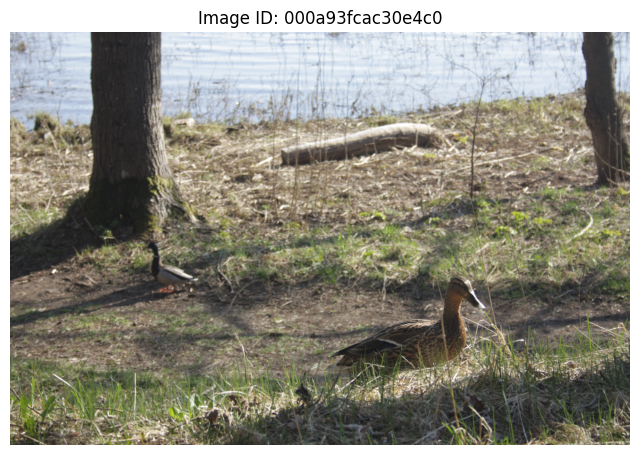

In [35]:
import matplotlib.pyplot as plt
import cv2

# Choose an image to display
image_id = "000a93fcac30e4c0"  # Replace with an actual ImageID from the available images
image_path = f"filtered_images/{image_id}.jpg"

# Load the image using OpenCV
image = cv2.imread(image_path)

if image is not None:
    # Convert the image from BGR to RGB for proper color display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()
else:
    print(f"Image {image_id} could not be loaded. Please check if the file exists and is valid.")


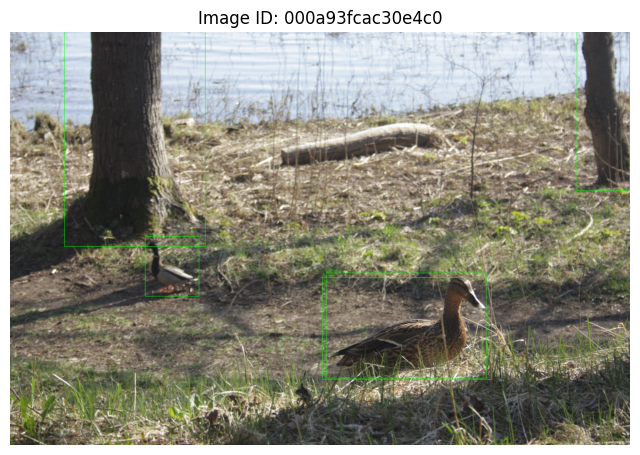

In [36]:
import cv2
import matplotlib.pyplot as plt

def display_image_with_boxes(image_id, annotations):
    # Path to the downloaded image
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} not found.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Create a copy of the image for drawing bounding boxes
    annotated_image = image.copy()

    # Draw bounding boxes on the image
    for _, row in annotations.iterrows():
        # Extract normalized bounding box coordinates
        xmin, xmax, ymin, ymax = row["XMin"], row["XMax"], row["YMin"], row["YMax"]
        
        # Scale coordinates to image dimensions
        xmin = int(xmin * annotated_image.shape[1])
        xmax = int(xmax * annotated_image.shape[1])
        ymin = int(ymin * annotated_image.shape[0])
        ymax = int(ymax * annotated_image.shape[0])

        # Draw the bounding box
        cv2.rectangle(annotated_image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        # Add label text near the box
        label = row["LabelName"]
        cv2.putText(annotated_image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

# Example usage
# image_id = sub_images_data.iloc[0]["ImageID"]  # Select a sample ImageID
filtered_annotations = filtered_annotations_data[filtered_annotations_data["ImageID"] == image_id]
display_image_with_boxes(image_id, filtered_annotations)


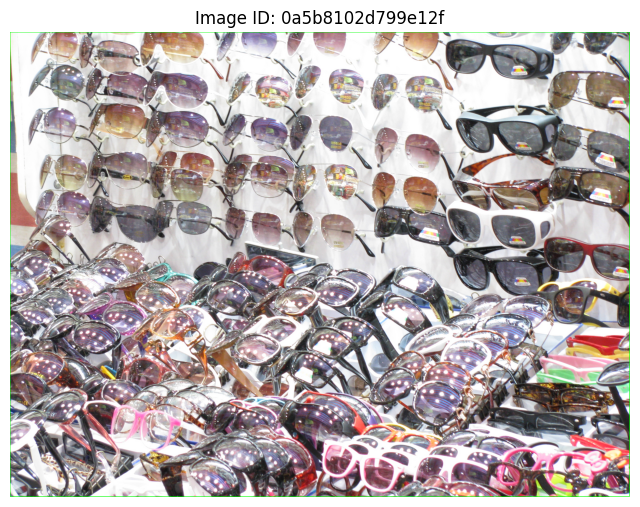

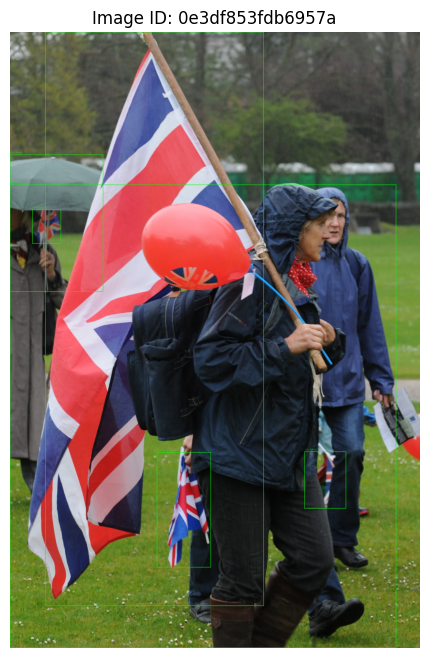

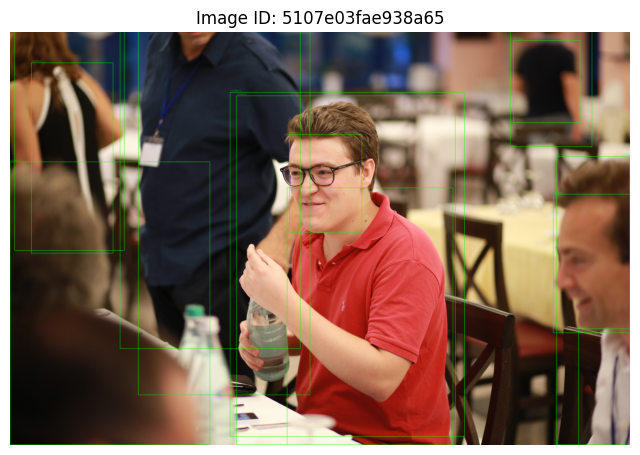

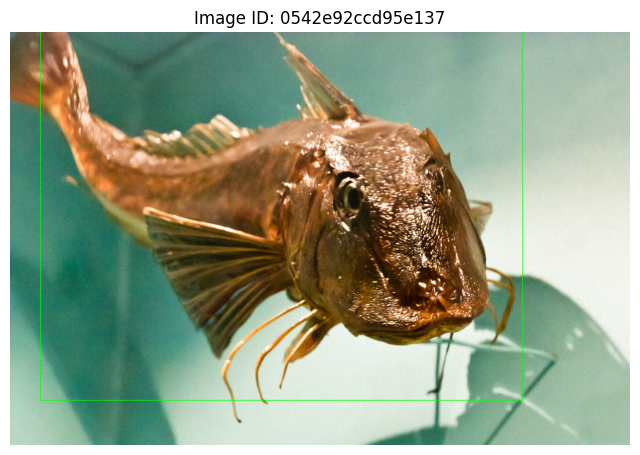

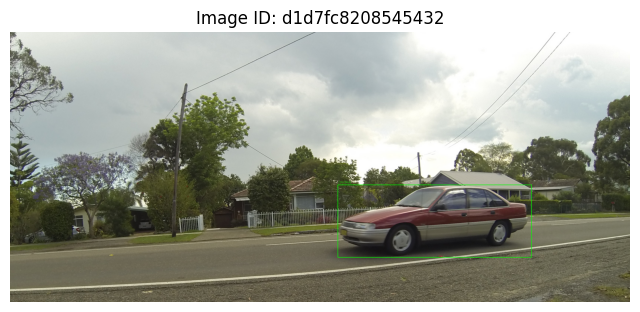

In [23]:
import random
import cv2
import matplotlib.pyplot as plt

def display_random_image_with_boxes(re_filtered_images, annotations_data):
    # Select a random ImageID from the re-filtered dataset
    image_id = random.choice(re_filtered_images["ImageID"].values)
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check if the file exists.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter bounding box annotations for the selected ImageID
    image_annotations = annotations_data[annotations_data["ImageID"] == image_id]

    # Annotate bounding boxes and labels on the image
    annotated_image = image.copy()
    for _, row in image_annotations.iterrows():
        # Extract bounding box coordinates (normalized) and scale them
        xmin = int(row["XMin"] * annotated_image.shape[1])
        xmax = int(row["XMax"] * annotated_image.shape[1])
        ymin = int(row["YMin"] * annotated_image.shape[0])
        ymax = int(row["YMax"] * annotated_image.shape[0])
        label = row["LabelName"]

        # Draw the bounding box
        cv2.rectangle(annotated_image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        # Put the label text near the box
        cv2.putText(annotated_image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

# Example usage
for i in range(5):
    display_random_image_with_boxes(re_filtered_images=pd.read_csv("filtered/re_filtered_images.csv"),
                                annotations_data=pd.read_csv("filtered/re_filtered_annotations.csv"))


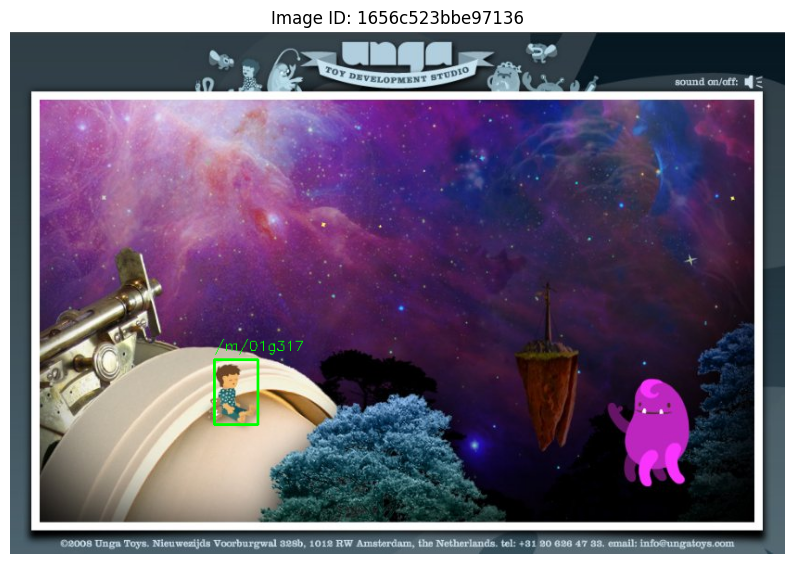

In [29]:
import random
import cv2
import matplotlib.pyplot as plt

def display_random_image_with_boxes_and_relations(re_filtered_images, annotations_data, relations_data):
    # Select a random ImageID from the re-filtered dataset
    image_id = random.choice(re_filtered_images["ImageID"].values)
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check if the file exists.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter bounding box annotations and relations for the selected ImageID
    image_annotations = annotations_data[annotations_data["ImageID"] == image_id]
    image_relations = relations_data[relations_data["ImageID"] == image_id]

    # Annotate bounding boxes, labels, and relationships
    annotated_image = image.copy()
    for _, row in image_annotations.iterrows():
        # Extract bounding box coordinates (normalized) and scale them
        xmin = int(row["XMin"] * annotated_image.shape[1])
        xmax = int(row["XMax"] * annotated_image.shape[1])
        ymin = int(row["YMin"] * annotated_image.shape[0])
        ymax = int(row["YMax"] * annotated_image.shape[0])
        label = row["LabelName"]

        # Draw the bounding box
        cv2.rectangle(annotated_image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        # Put the label text near the box
        cv2.putText(annotated_image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    # Annotate relationships between objects
    for _, row in image_relations.iterrows():
        # Extract bounding boxes and relationship label
        xmin1 = int(row["XMin1"] * annotated_image.shape[1])
        xmax1 = int(row["XMax1"] * annotated_image.shape[1])
        ymin1 = int(row["YMin1"] * annotated_image.shape[0])
        ymax1 = int(row["YMax1"] * annotated_image.shape[0])

        xmin2 = int(row["XMin2"] * annotated_image.shape[1])
        xmax2 = int(row["XMax2"] * annotated_image.shape[1])
        ymin2 = int(row["YMin2"] * annotated_image.shape[0])
        ymax2 = int(row["YMax2"] * annotated_image.shape[0])

        relationship = row["RelationshipLabel"]

        # Draw a line connecting the two objects
        center1 = ((xmin1 + xmax1) // 2, (ymin1 + ymax1) // 2)
        center2 = ((xmin2 + xmax2) // 2, (ymin2 + ymax2) // 2)
        cv2.line(annotated_image, center1, center2, (255, 0, 0), 3)

        # Put relationship label near the center of the line
        mid_point = ((center1[0] + center2[0]) // 2, (center1[1] + center2[1]) // 2)
        cv2.putText(annotated_image, relationship, mid_point, cv2.FONT_HERSHEY_SIMPLEX, 5, (0,0, 255), 2)

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

# Example usage
display_random_image_with_boxes_and_relations(
    re_filtered_images=pd.read_csv("filtered/re_filtered_images.csv"),
    annotations_data=pd.read_csv("filtered/re_filtered_annotations.csv"),
    relations_data=pd.read_csv("filtered/re_filtered_relations.csv")
)


In [30]:
re_label = pd.read_csv("/kaggle/working/filtered/re_filtered_labels.csv")
re_label

,ImageID,Source,LabelName,Confidence
0,000a93fcac30e4c0,verification,/m/015p6,1
1,000a93fcac30e4c0,verification,/m/03fwl,0
2,000a93fcac30e4c0,verification,/m/04c0y,0
3,000a93fcac30e4c0,verification,/m/04rky,0
4,000a93fcac30e4c0,verification,/m/05n4y,0
...,...,...,...,...
4370,ffbfc5cb384a9bfe,verification,/m/01s105,0
4371,ffbfc5cb384a9bfe,verification,/m/02dgv,1
4372,ffbfc5cb384a9bfe,verification,/m/0cgh4,0
4373,ffbfc5cb384a9bfe,verification,/m/0c_jw,0


In [31]:

import os
for dirname, _, filenames in os.walk('/kaggle/input/open-images-v4-metadata'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/open-images-v4-metadata/class-descriptions-boxable.csv
/kaggle/input/open-images-v4-metadata/challenge-2018-attributes-description.csv
/kaggle/input/open-images-v4-metadata/challenge-2018-relationship-triplets.csv
/kaggle/input/open-images-v4-metadata/challenge-2018-relationships-description.csv


In [32]:
import pandas as pd

# Load metadata for label descriptions
class_descriptions = pd.read_csv("/kaggle/input/open-images-v4-metadata/class-descriptions-boxable.csv", names=["LabelName", "LabelDescription"])

# Load re-filtered datasets
re_filtered_annotations = pd.read_csv("filtered/re_filtered_annotations.csv")
re_filtered_labels = pd.read_csv("filtered/re_filtered_labels.csv")
re_filtered_relations = pd.read_csv("filtered/re_filtered_relations.csv")

# Replace LabelName in annotations and labels with LabelDescription
re_filtered_annotations = re_filtered_annotations.merge(class_descriptions, on="LabelName", how="left")
re_filtered_labels = re_filtered_labels.merge(class_descriptions, on="LabelName", how="left")

# For relations, replace LabelName1 and LabelName2
re_filtered_relations = re_filtered_relations.merge(class_descriptions.rename(columns={"LabelName": "LabelName1", "LabelDescription": "LabelDescription1"}), on="LabelName1", how="left")
re_filtered_relations = re_filtered_relations.merge(class_descriptions.rename(columns={"LabelName": "LabelName2", "LabelDescription": "LabelDescription2"}), on="LabelName2", how="left")

# Save updated datasets
re_filtered_annotations.to_csv("filtered/annotations_with_descriptions.csv", index=False)
re_filtered_labels.to_csv("filtered/labels_with_descriptions.csv", index=False)
re_filtered_relations.to_csv("filtered/relations_with_descriptions.csv", index=False)

print("Label names replaced with human-readable descriptions successfully!")


Label names replaced with human-readable descriptions successfully!


In [33]:
re_label = pd.read_csv("/kaggle/working/filtered/re_filtered_labels.csv")
re_label

,ImageID,Source,LabelName,Confidence
0,000a93fcac30e4c0,verification,/m/015p6,1
1,000a93fcac30e4c0,verification,/m/03fwl,0
2,000a93fcac30e4c0,verification,/m/04c0y,0
3,000a93fcac30e4c0,verification,/m/04rky,0
4,000a93fcac30e4c0,verification,/m/05n4y,0
...,...,...,...,...
4370,ffbfc5cb384a9bfe,verification,/m/01s105,0
4371,ffbfc5cb384a9bfe,verification,/m/02dgv,1
4372,ffbfc5cb384a9bfe,verification,/m/0cgh4,0
4373,ffbfc5cb384a9bfe,verification,/m/0c_jw,0


In [34]:
re_filtered_annotations

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,LabelDescription
0,000a93fcac30e4c0,activemil,/m/09ddx,1,0.503750,0.776875,0.595685,0.841463,1,0,0,0,0,Duck
1,000a93fcac30e4c0,xclick,/m/07j7r,1,0.088125,0.315000,0.000000,0.520638,1,1,0,0,0,Tree
2,000a93fcac30e4c0,xclick,/m/07j7r,1,0.914375,0.999375,0.000000,0.385553,0,1,0,0,0,Tree
3,000a93fcac30e4c0,xclick,/m/09ddx,1,0.218125,0.305000,0.496248,0.640713,1,0,0,0,0,Duck
4,000a93fcac30e4c0,xclick,/m/0dbvp,1,0.510625,0.768125,0.584428,0.838649,1,0,0,0,0,Goose
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7106,ffa830b116ffb7cd,xclick,/m/07j7r,1,0.004375,0.256250,0.063386,0.688907,1,1,0,0,0,Tree
7107,ffa830b116ffb7cd,xclick,/m/07j7r,1,0.400000,0.999375,0.000000,0.598832,1,1,1,0,0,Tree
7108,ffa830b116ffb7cd,xclick,/m/0cvnqh,1,0.377500,0.436875,0.368641,0.427023,1,0,0,0,0,Bench
7109,ffa830b116ffb7cd,xclick,/m/0cvnqh,1,0.422500,0.466250,0.349458,0.386155,1,0,0,0,0,Bench


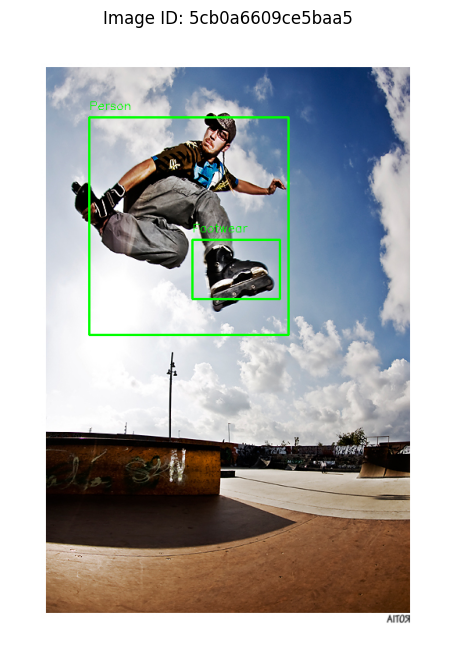

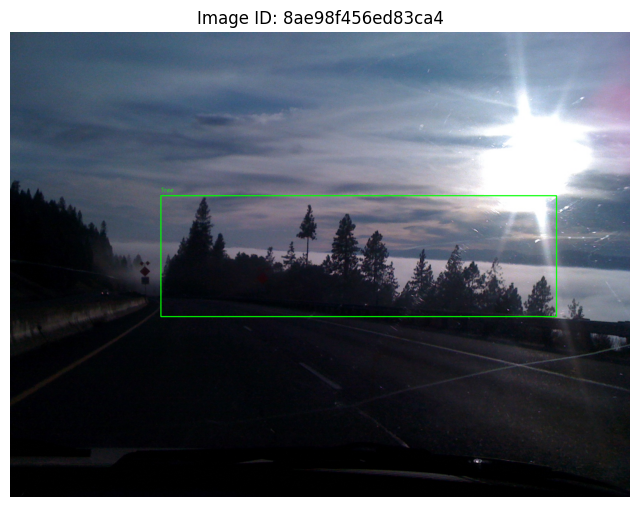

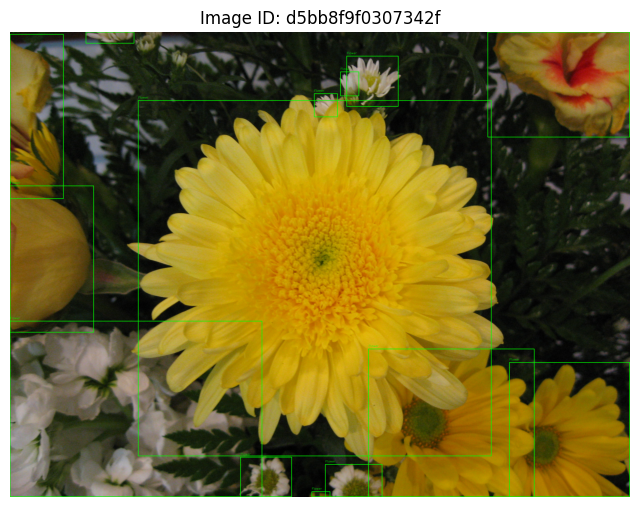

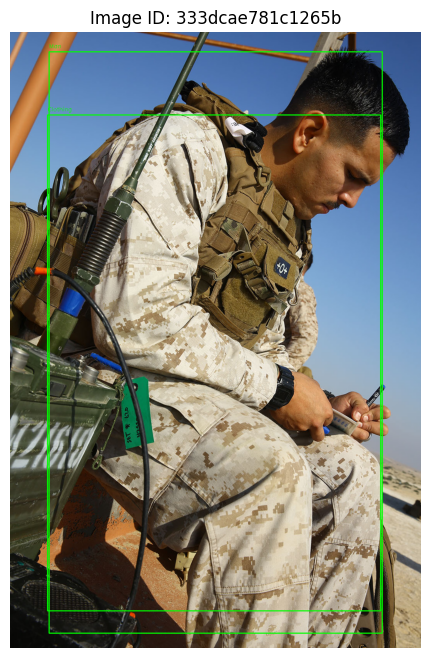

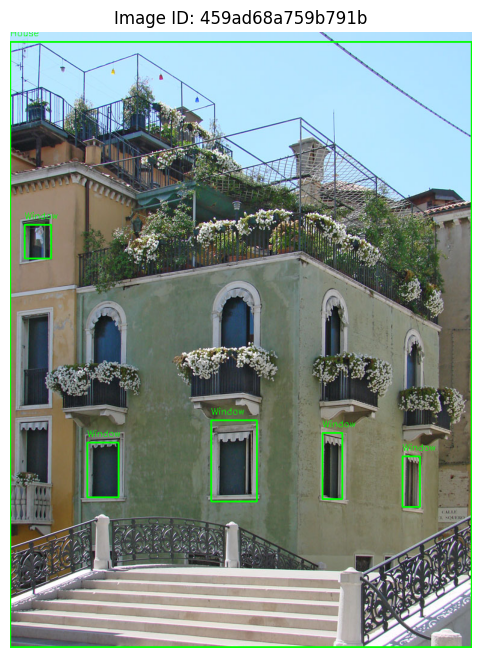

In [37]:
import random
import cv2
import matplotlib.pyplot as plt

def display_random_image_with_boxes_and_labels(re_filtered_images, enriched_annotations):
    # Select a random ImageID from the re-filtered dataset
    image_id = random.choice(re_filtered_images["ImageID"].values)
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check if the file exists.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter annotations for the selected ImageID
    image_annotations = enriched_annotations[enriched_annotations["ImageID"] == image_id]

    # Annotate bounding boxes and labels on the image
    annotated_image = image.copy()
    for _, row in image_annotations.iterrows():
        # Extract bounding box coordinates (normalized) and scale them
        xmin = int(row["XMin"] * annotated_image.shape[1])
        xmax = int(row["XMax"] * annotated_image.shape[1])
        ymin = int(row["YMin"] * annotated_image.shape[0])
        ymax = int(row["YMax"] * annotated_image.shape[0])
        label = row["LabelDescription"]  # Use human-readable label description

        # Draw the bounding box
        cv2.rectangle(annotated_image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        # Put the label text near the box
        cv2.putText(annotated_image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

# Example usage: Display 5 random images with proper labels
for _ in range(5):
    display_random_image_with_boxes_and_labels(
        re_filtered_images=pd.read_csv("filtered/re_filtered_images.csv"),
        enriched_annotations=pd.read_csv("filtered/annotations_with_descriptions.csv")
    )


75c2822354862ba0


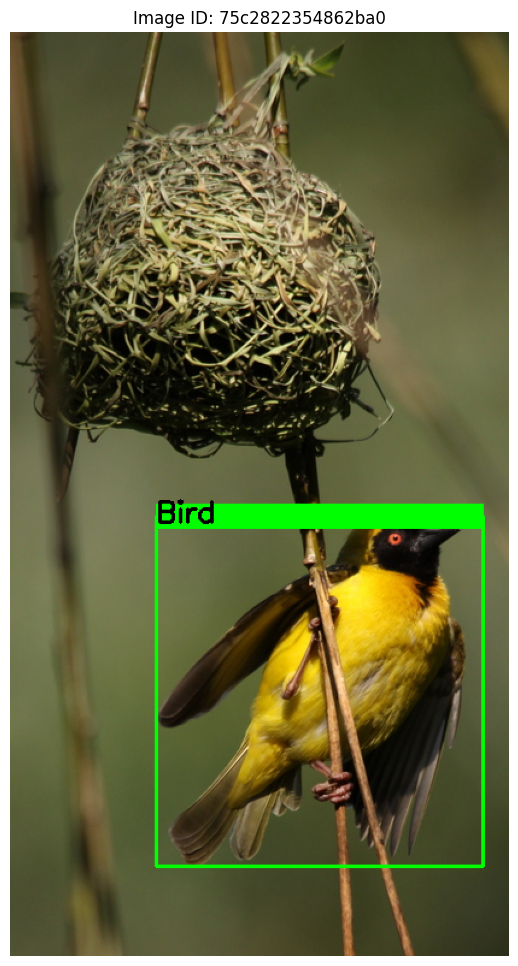


Relationships detected in the image:
[]
4e3bd5bc22c82ff9


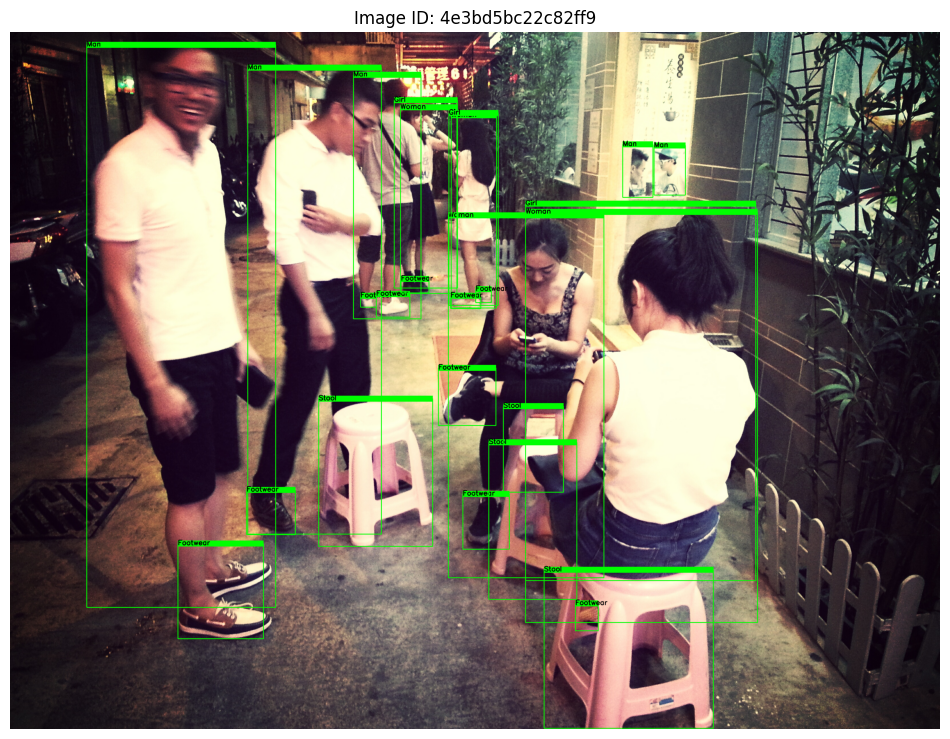


Relationships detected in the image:
[]


In [46]:
import random
import cv2
import matplotlib.pyplot as plt

def display_random_image_with_boxes_labels_and_relations(re_filtered_images, enriched_annotations, enriched_relations):
    # Select a random ImageID from the re-filtered dataset
    image_id = random.choice(re_filtered_images["ImageID"].values)
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check if the file exists.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter annotations and relations for the selected ImageID
    image_annotations = enriched_annotations[enriched_annotations["ImageID"] == image_id]
    image_relations = enriched_relations[enriched_relations["ImageID"] == image_id]

    # Annotate bounding boxes and labels on the image
    annotated_image = image.copy()
    for _, row in image_annotations.iterrows():
        # Extract bounding box coordinates (normalized) and scale them
        xmin = int(row["XMin"] * annotated_image.shape[1])
        xmax = int(row["XMax"] * annotated_image.shape[1])
        ymin = int(row["YMin"] * annotated_image.shape[0])
        ymax = int(row["YMax"] * annotated_image.shape[0])
        label = row["LabelDescription"]

        # Draw the bounding box
        cv2.rectangle(annotated_image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        # Put the label text with a green background
        label_bg = xmin, ymin - 10, xmax, ymin + 10  # Background dimensions
        cv2.rectangle(annotated_image, (label_bg[0], label_bg[1]), (label_bg[2], label_bg[3]), (0, 255, 0), -1)  # Green background
        cv2.putText(annotated_image, label, (xmin, ymin + 5), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 2)  # Black text

    # Collect relationship phrases
    relationships = []
    for _, row in image_relations.iterrows():
        object1 = row["LabelDescription1"]
        object2 = row["LabelDescription2"]
        relationship = row["RelationshipDescription"]
        relationships.append(f"{object1} {relationship} {object2}")

    # Display the image
    print(image_id)
    plt.figure(figsize=(12, 12))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

    # Print relationships below the image
    print("\nRelationships detected in the image:")
    print(relationships)
    for relation in relationships:
        print(f"- {relation}")

# Example usage: Display 5 random images with labels and relationships
for _ in range(2):
    display_random_image_with_boxes_labels_and_relations(
        re_filtered_images=pd.read_csv("filtered/re_filtered_images.csv"),
        enriched_annotations=pd.read_csv("filtered/annotations_with_descriptions.csv"),
        enriched_relations=pd.read_csv("filtered/relations_with_descriptions.csv")
    )


In [47]:
import pandas as pd

# Load the relations file
relations_data = pd.read_csv("/kaggle/working/filtered/re_filtered_relations.csv")

# Function to search for specific ImageID and print relationships
def search_relationships(image_id):
    # Filter the data for the specific ImageID
    filtered_relations = relations_data[relations_data["ImageID"] == image_id]

    if filtered_relations.empty:
        print(f"No relationships found for ImageID: {image_id}")
    else:
        print(f"Relationships for ImageID: {image_id}")
        for _, row in filtered_relations.iterrows():
            object1 = row["LabelDescription1"]
            object2 = row["LabelDescription2"]
            relationship = row["RelationshipDescription"]
            print(f"- {object1} {relationship} {object2}")

# Example usage: Replace "your_image_id_here" with the actual ImageID
image_id = "75c2822354862ba0"  # Replace with desired ImageID
search_relationships(image_id)


No relationships found for ImageID: 75c2822354862ba0


In [42]:
import random
import pandas as pd

# Load the relations file
relations_data = pd.read_csv("/kaggle/working/filtered/re_filtered_relations.csv")

# Function to search for specific ImageID and print relationships
def search_random_relationships(relations_data):
    # Select a random ImageID from the relations dataset
    random_image_id = random.choice(relations_data["ImageID"].unique())
    
    # Filter the data for the random ImageID
    filtered_relations = relations_data[relations_data["ImageID"] == random_image_id]

    if filtered_relations.empty:
        print(f"No relationships found for ImageID: {random_image_id}")
    else:
        print(f"Relationships for ImageID: {random_image_id}")
        for _, row in filtered_relations.iterrows():
            object1 = row["LabelDescription1"]
            object2 = row["LabelDescription2"]
            relationship = row["RelationshipDescription"]
            print(f"- {object1} {relationship} {object2}")

# Example usage
search_random_relationships(relations_data)


Relationships for ImageID: d50284eea922ab0b


KeyError: 'LabelDescription1'

In [55]:
import pandas as pd

# Load the CSV file
df1 = pd.read_csv("/kaggle/working/filtered/re_filtered_relations.csv")

# Filter rows where ImageID matches '4e3bd5bc22c82ff9'
filtered_rows = df1[df1['ImageID'] == '4e3bd5bc22c82ff9']

# Display the filtered rows
print(filtered_rows)


Empty DataFrame
Columns: [ImageID, LabelName1, LabelName2, XMin1, XMax1, YMin1, YMax1, XMin2, XMax2, YMin2, YMax2, RelationshipLabel]
Index: []


In [56]:
df1

,ImageID,LabelName1,LabelName2,XMin1,XMax1,YMin1,YMax1,XMin2,XMax2,YMin2,YMax2,RelationshipLabel
0,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is
1,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.442145,0.514581,0.313125,0.350625,0.442145,0.514581,0.313125,0.350625,is
2,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.473189,0.624647,0.352500,0.418750,0.473189,0.624647,0.352500,0.418750,is
3,a761bcc45abd412a,/m/01mzpv,/m/083vt,0.574264,0.950704,0.436250,0.963750,0.574264,0.950704,0.436250,0.963750,is
4,51dd3f54fff278b0,/m/07y_7,/m/083vt,0.571875,0.891875,0.276735,0.782364,0.571875,0.891875,0.276735,0.782364,is
...,...,...,...,...,...,...,...,...,...,...,...,...
223,a9583747d29a2387,/m/01mzpv,/m/04bcr3,0.186875,0.365000,0.575000,0.886667,0.000000,0.884375,0.552500,0.821667,at
224,3307482b4acfaef1,/m/04yx4,/m/04bcr3,0.160625,0.360625,0.436210,0.865854,0.284375,0.501250,0.660413,0.950281,at
225,be8304b6b0699dd9,/m/01mzpv,/m/04bcr3,0.540625,0.726250,0.606942,0.999062,0.304375,0.574375,0.537523,0.954972,at
226,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.658514,0.714958,0.321875,0.357500,0.658514,0.714958,0.321875,0.357500,is


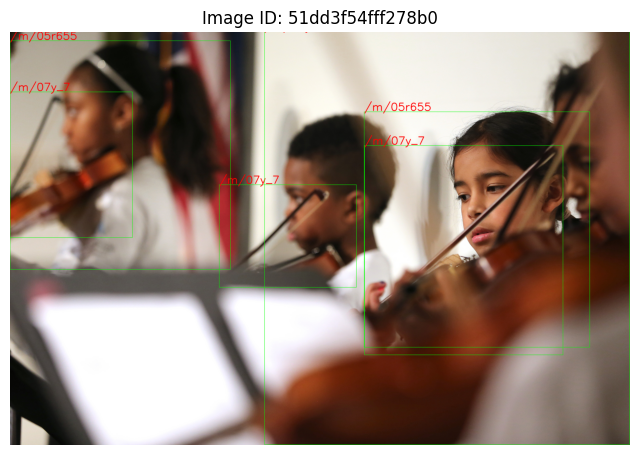

In [63]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt

def display_image_with_bounding_boxes(image_id, bbox_data):
    # Image path
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check the file.")
        return

    # Convert the image from BGR to RGB for Matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Annotate bounding boxes on the image
    annotated_image = image.copy()
    for _, row in bbox_data.iterrows():
        # Extract bounding box coordinates (normalized) and scale them
        xmin = int(row["XMin1"] * annotated_image.shape[1])
        xmax = int(row["XMax1"] * annotated_image.shape[1])
        ymin = int(row["YMin1"] * annotated_image.shape[0])
        ymax = int(row["YMax1"] * annotated_image.shape[0])

        # Extract label for the object
        label1 = row["LabelName1"]

        # Draw the bounding box
        cv2.rectangle(annotated_image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        
        # Add label text near the bounding box
        cv2.putText(annotated_image, label1, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 3, (255,0, 0), 5)

    # Display the image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

# Load the dataset with relationships and bounding box data
df1 = pd.read_csv("/kaggle/working/filtered/re_filtered_relations.csv")

# Select the ImageID to visualize (use any valid one, or choose randomly)
image_id = "51dd3f54fff278b0"

# Filter rows for the selected ImageID
filtered_bboxes = df1[df1["ImageID"] == image_id]

# Display the image with bounding boxes
display_image_with_bounding_boxes(image_id, filtered_bboxes)


In [64]:
filtered_bboxes

,ImageID,LabelName1,LabelName2,XMin1,XMax1,YMin1,YMax1,XMin2,XMax2,YMin2,YMax2,RelationshipLabel
4,51dd3f54fff278b0,/m/07y_7,/m/083vt,0.571875,0.891875,0.276735,0.782364,0.571875,0.891875,0.276735,0.782364,is
7,51dd3f54fff278b0,/m/07y_7,/m/083vt,0.337500,0.558750,0.371482,0.619137,0.337500,0.558750,0.371482,0.619137,is
70,51dd3f54fff278b0,/m/05r655,/m/07y_7,0.571250,0.935000,0.195122,0.763602,0.571875,0.891875,0.276735,0.782364,plays
71,51dd3f54fff278b0,/m/07y_7,/m/083vt,0.410625,0.999375,0.000000,0.999062,0.410625,0.999375,0.000000,0.999062,is
95,51dd3f54fff278b0,/m/05r655,/m/07y_7,0.571250,0.935000,0.195122,0.763602,0.337500,0.558750,0.371482,0.619137,holds
115,51dd3f54fff278b0,/m/07y_7,/m/083vt,0.000000,0.197500,0.147280,0.499062,0.000000,0.197500,0.147280,0.499062,is
127,51dd3f54fff278b0,/m/05r655,/m/07y_7,0.000000,0.355625,0.023452,0.575985,0.000000,0.197500,0.147280,0.499062,plays
143,51dd3f54fff278b0,/m/05r655,/m/07y_7,0.000000,0.355625,0.023452,0.575985,0.000000,0.197500,0.147280,0.499062,holds
192,51dd3f54fff278b0,/m/05r655,/m/07y_7,0.571250,0.935000,0.195122,0.763602,0.571875,0.891875,0.276735,0.782364,holds


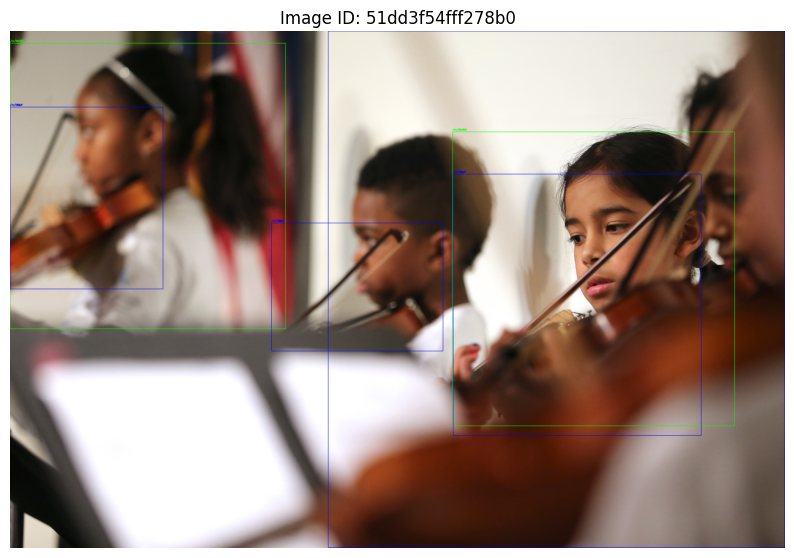


Relationships detected in the image:
- /m/07y_7 is /m/083vt
- /m/07y_7 is /m/083vt
- /m/05r655 plays /m/07y_7
- /m/07y_7 is /m/083vt
- /m/05r655 holds /m/07y_7
- /m/07y_7 is /m/083vt
- /m/05r655 plays /m/07y_7
- /m/05r655 holds /m/07y_7
- /m/05r655 holds /m/07y_7


In [65]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt

def display_image_with_bboxes_and_relationships(image_id, relations_data):
    # Image path
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check the file.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter rows for the given ImageID
    filtered_data = relations_data[relations_data["ImageID"] == image_id]

    # Annotate bounding boxes and relationships on the image
    annotated_image = image.copy()
    relationships = []
    for _, row in filtered_data.iterrows():
        # Extract bounding box coordinates for the two objects
        # Object 1
        xmin1, xmax1 = int(row["XMin1"] * image.shape[1]), int(row["XMax1"] * image.shape[1])
        ymin1, ymax1 = int(row["YMin1"] * image.shape[0]), int(row["YMax1"] * image.shape[0])
        label1 = row["LabelName1"]

        # Object 2
        xmin2, xmax2 = int(row["XMin2"] * image.shape[1]), int(row["XMax2"] * image.shape[1])
        ymin2, ymax2 = int(row["YMin2"] * image.shape[0]), int(row["YMax2"] * image.shape[0])
        label2 = row["LabelName2"]

        # Relationship
        relationship = row["RelationshipLabel"]

        # Draw bounding boxes for both objects
        cv2.rectangle(annotated_image, (xmin1, ymin1), (xmax1, ymax1), (0, 255, 0), 2)  # Green for Object 1
        cv2.rectangle(annotated_image, (xmin2, ymin2), (xmax2, ymax2), (0, 0, 255), 2)  # Red for Object 2

        # Add labels
        cv2.putText(annotated_image, label1, (xmin1, ymin1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.putText(annotated_image, label2, (xmin2, ymin2 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

        # Collect relationships to display below the image
        relationships.append(f"{label1} {relationship} {label2}")

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

    # Print relationships below the image
    print("\nRelationships detected in the image:")
    for rel in relationships:
        print(f"- {rel}")

# Load the relations file
relations_data = pd.read_csv("/kaggle/working/filtered/re_filtered_relations.csv")

# Set the ImageID to visualize (provided example: '51dd3f54fff278b0')
image_id = "51dd3f54fff278b0"

# Display the image with bounding boxes and relationships
display_image_with_bboxes_and_relationships(image_id, relations_data)


In [66]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt

def display_image_with_bboxes_and_relationships(image_id, relations_data):
    # Image path
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check the file.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter rows for the given ImageID
    filtered_data = relations_data[relations_data["ImageID"] == image_id]

    # Annotate bounding boxes and relationships on the image
    annotated_image = image.copy()
    relationships = []
    for _, row in filtered_data.iterrows():
        # Extract bounding box coordinates for the two objects
        # Object 1
        xmin1, xmax1 = int(row["XMin1"] * image.shape[1]), int(row["XMax1"] * image.shape[1])
        ymin1, ymax1 = int(row["YMin1"] * image.shape[0]), int(row["YMax1"] * image.shape[0])
        label1 = row["LabelDescription1"]

        # Object 2
        xmin2, xmax2 = int(row["XMin2"] * image.shape[1]), int(row["XMax2"] * image.shape[1])
        ymin2, ymax2 = int(row["YMin2"] * image.shape[0]), int(row["YMax2"] * image.shape[0])
        label2 = row["LabelDescription2"]

        # Relationship
        relationship = row["RelationshipDescription"]

        # Draw bounding boxes for both objects
        cv2.rectangle(annotated_image, (xmin1, ymin1), (xmax1, ymax1), (0, 255, 0), 2)  # Green for Object 1
        cv2.rectangle(annotated_image, (xmin2, ymin2), (xmax2, ymax2), (0, 0, 255), 2)  # Red for Object 2

        # Add labels
        cv2.putText(annotated_image, label1, (xmin1, ymin1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.putText(annotated_image, label2, (xmin2, ymin2 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

        # Collect relationships to display below the image
        relationships.append(f"{label1} {relationship} {label2}")

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

    # Print relationships below the image
    print("\nRelationships detected in the image:")
    for rel in relationships:
        print(f"- {rel}")

# Load the enriched relations file
relations_data = pd.read_csv("filtered/relations_with_descriptions.csv")

# Set the ImageID to visualize (example: '51dd3f54fff278b0')
image_id = "51dd3f54fff278b0"

# Display the image with bounding boxes and relationships
display_image_with_bboxes_and_relationships(image_id, relations_data)


KeyError: 'RelationshipDescription'

In [67]:
import pandas as pd

# Load the CSV files
rel1 = pd.read_csv("filtered/relations_with_descriptions.csv")
rel2 = pd.read_csv("/kaggle/working/filtered/re_filtered_relations.csv")

# Merge the data to add Label1Description and Label2Description
rel2 = rel2.merge(
    rel1[['ImageID', 'LabelName1', 'LabelDescription1']],
    on=['ImageID', 'LabelName1'],
    how='left'
)

rel2 = rel2.merge(
    rel1[['ImageID', 'LabelName2', 'LabelDescription2']],
    on=['ImageID', 'LabelName2'],
    how='left'
)

# Display the resulting DataFrame
print(rel2.head())

# Save the updated file if needed
rel2.to_csv("/kaggle/working/updated_relations_with_descriptions.csv", index=False)


            ImageID LabelName1 LabelName2     XMin1     XMax1     YMin1  \
0  2d490b16d2fa7572  /m/01mzpv   /m/05z87  0.823142  0.876764  0.335625   
1  2d490b16d2fa7572  /m/01mzpv   /m/05z87  0.823142  0.876764  0.335625   
2  2d490b16d2fa7572  /m/01mzpv   /m/05z87  0.823142  0.876764  0.335625   
3  2d490b16d2fa7572  /m/01mzpv   /m/05z87  0.823142  0.876764  0.335625   
4  2d490b16d2fa7572  /m/01mzpv   /m/05z87  0.823142  0.876764  0.335625   

     YMax1     XMin2     XMax2     YMin2    YMax2 RelationshipLabel  \
0  0.37625  0.823142  0.876764  0.335625  0.37625                is   
1  0.37625  0.823142  0.876764  0.335625  0.37625                is   
2  0.37625  0.823142  0.876764  0.335625  0.37625                is   
3  0.37625  0.823142  0.876764  0.335625  0.37625                is   
4  0.37625  0.823142  0.876764  0.335625  0.37625                is   

  LabelDescription1 LabelDescription2  
0             Chair               NaN  
1             Chair               NaN  
2 

In [68]:
updated_relations_data = pd.read_csv("/kaggle/working/updated_relations_with_descriptions.csv")
updated_relations_data

,ImageID,LabelName1,LabelName2,XMin1,XMax1,YMin1,YMax1,XMin2,XMax2,YMin2,YMax2,RelationshipLabel,LabelDescription1,LabelDescription2
0,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is,Chair,NaN
1,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is,Chair,NaN
2,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is,Chair,NaN
3,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is,Chair,NaN
4,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is,Chair,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15013,a9583747d29a2387,/m/01mzpv,/m/01y9k5,0.566875,0.717500,0.611667,0.878333,0.478750,0.965625,0.558333,0.834167,at,Chair,Desk
15014,a9583747d29a2387,/m/01mzpv,/m/01y9k5,0.566875,0.717500,0.611667,0.878333,0.478750,0.965625,0.558333,0.834167,at,Chair,Desk
15015,a9583747d29a2387,/m/01mzpv,/m/01y9k5,0.566875,0.717500,0.611667,0.878333,0.478750,0.965625,0.558333,0.834167,at,Chair,Desk
15016,a9583747d29a2387,/m/01mzpv,/m/01y9k5,0.566875,0.717500,0.611667,0.878333,0.478750,0.965625,0.558333,0.834167,at,Chair,Desk


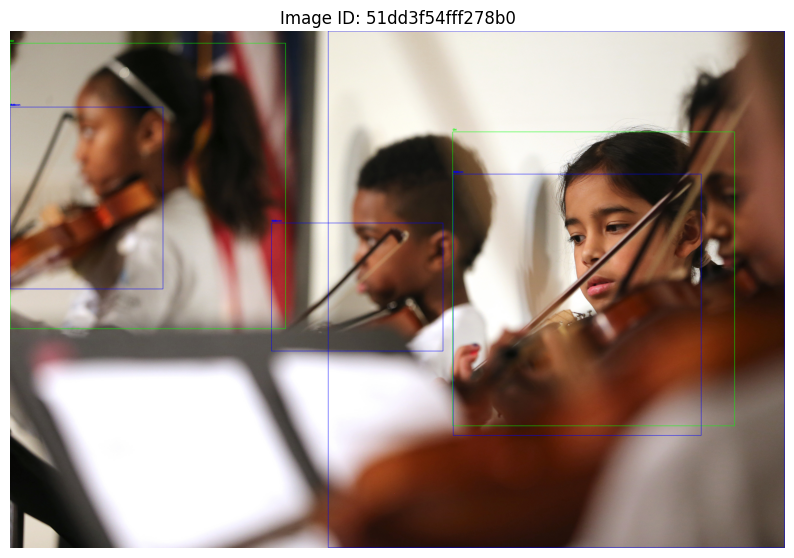


Relationships detected in the image:
- Girl plays Violin
- Girl holds Violin
- Violin is Unknown


In [76]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt

def display_image_with_bboxes_and_relationships(image_id, relations_data):
    # Image path
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check the file.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter rows for the given ImageID
    filtered_data = relations_data[relations_data["ImageID"] == image_id]

    # Annotate bounding boxes and relationships on the image
    annotated_image = image.copy()
    relationships = set()
    for _, row in filtered_data.iterrows():
        # Ensure labels are strings and handle missing values
        label1 = str(row["LabelDescription1"]) if not pd.isnull(row["LabelDescription1"]) else "Unknown"
        label2 = str(row["LabelDescription2"]) if not pd.isnull(row["LabelDescription2"]) else "Unknown"
        relationship = str(row["RelationshipLabel"]) if not pd.isnull(row["RelationshipLabel"]) else "Unknown"

        # Extract bounding box coordinates for the two objects
        xmin1, xmax1 = int(row["XMin1"] * image.shape[1]), int(row["XMax1"] * image.shape[1])
        ymin1, ymax1 = int(row["YMin1"] * image.shape[0]), int(row["YMax1"] * image.shape[0])
        xmin2, xmax2 = int(row["XMin2"] * image.shape[1]), int(row["XMax2"] * image.shape[1])
        ymin2, ymax2 = int(row["YMin2"] * image.shape[0]), int(row["YMax2"] * image.shape[0])

        # Draw bounding boxes for both objects
        cv2.rectangle(annotated_image, (xmin1, ymin1), (xmax1, ymax1), (0, 255, 0), 2)  # Green for Object 1
        cv2.rectangle(annotated_image, (xmin2, ymin2), (xmax2, ymax2), (0, 0, 255), 2)  # Red for Object 2

        # Add labels
        cv2.putText(annotated_image, label1, (xmin1, ymin1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.putText(annotated_image, label2, (xmin2, ymin2 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

        # Collect relationships to display below the image
        relationships.add(f"{label1} {relationship} {label2}")

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

    # Print relationships below the image
    print("\nRelationships detected in the image:")
    for rel in relationships:
        print(f"- {rel}")

# Set the ImageID to visualize (example: '51dd3f54fff278b0')
image_id = "51dd3f54fff278b0"

# Display the image with bounding boxes and relationships
display_image_with_bboxes_and_relationships(image_id, updated_relations_data)


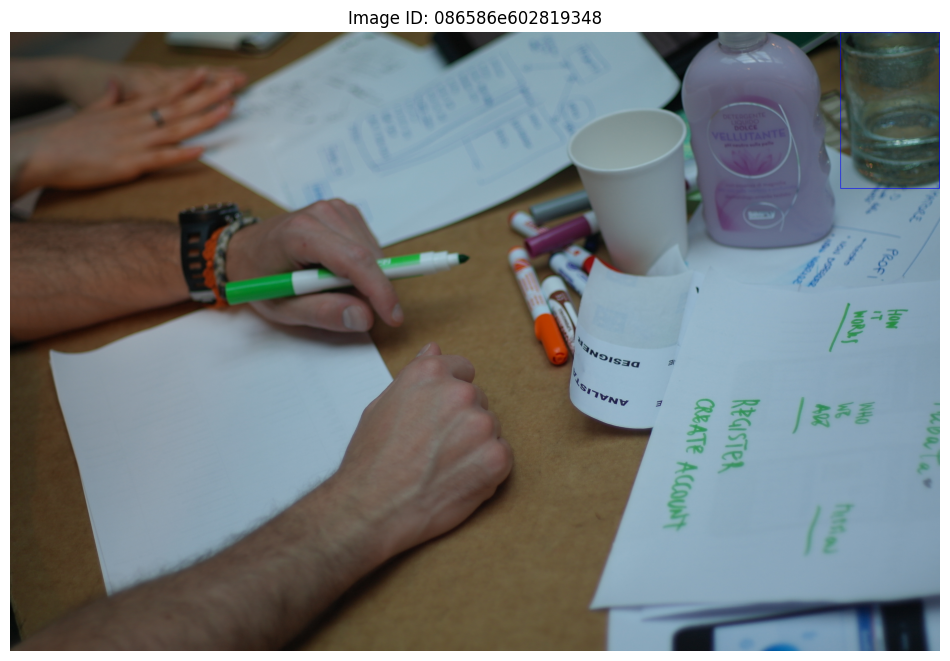


Relationships detected in the image:
- Bottle is Unknown


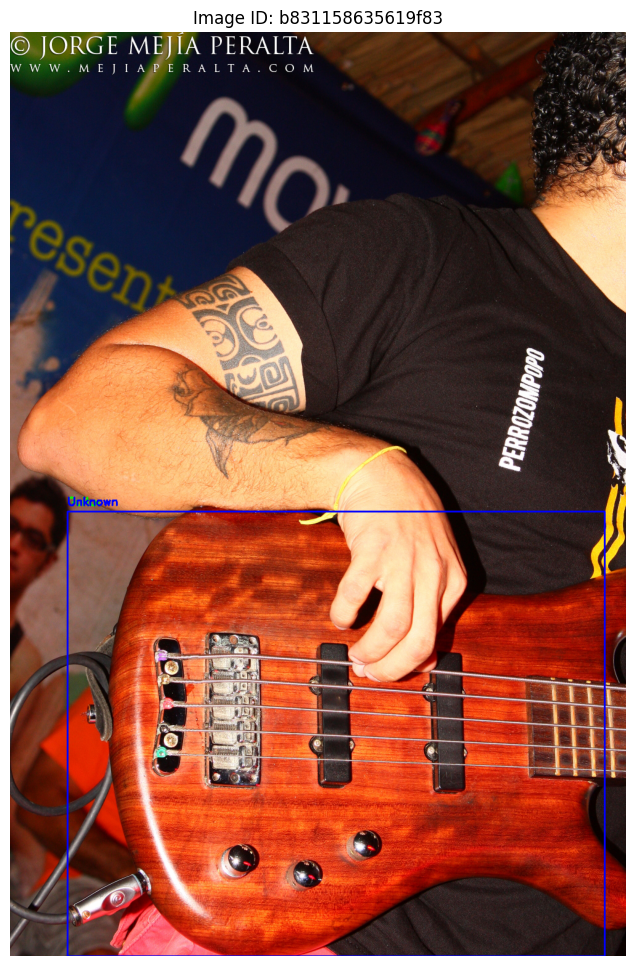


Relationships detected in the image:
- Guitar is Unknown


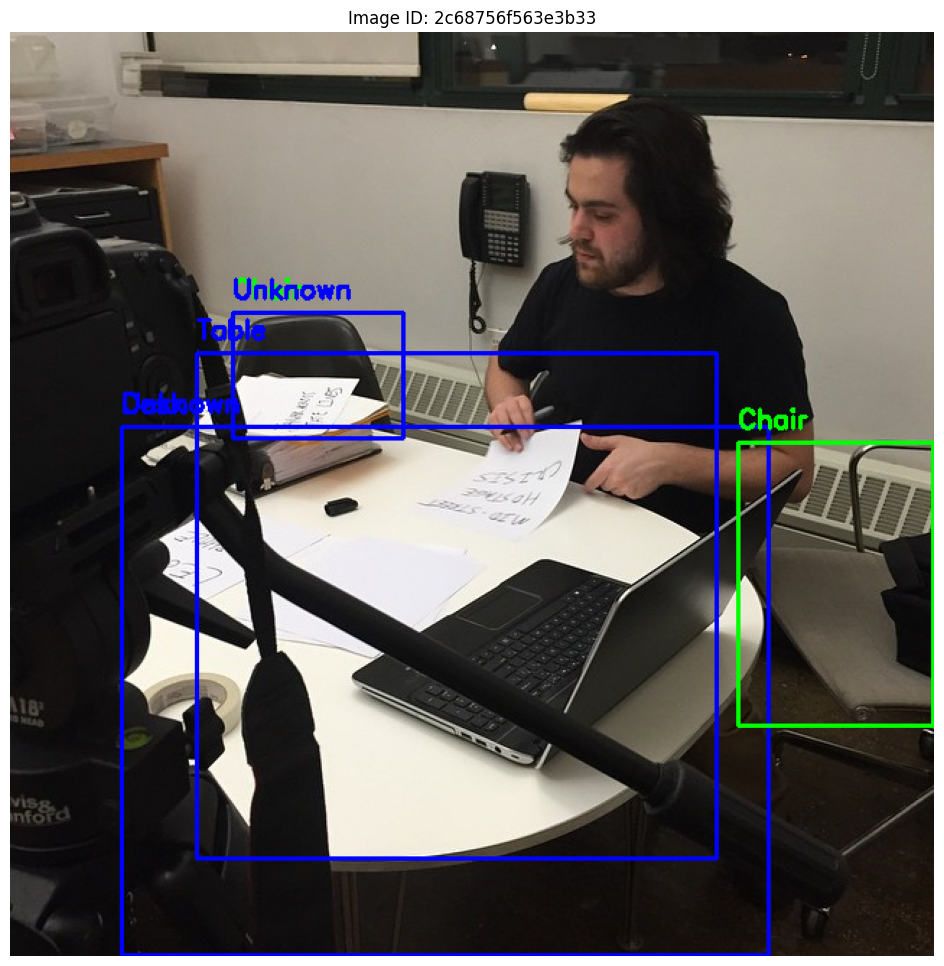


Relationships detected in the image:
- Chair at Table
- Desk is Unknown
- Chair is Unknown
- Chair at Desk


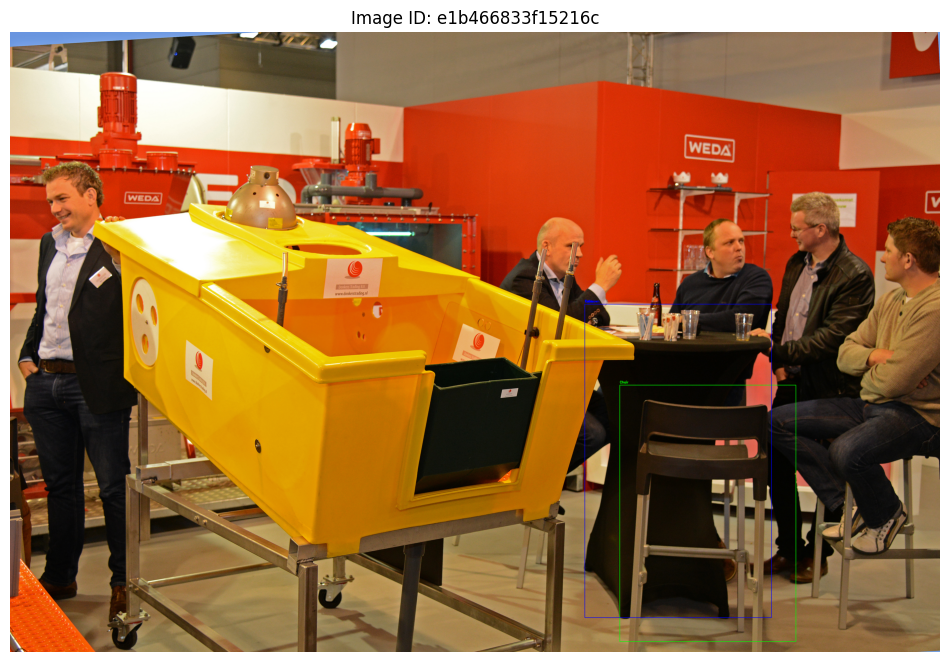


Relationships detected in the image:
- Chair at Table
- Table is Unknown


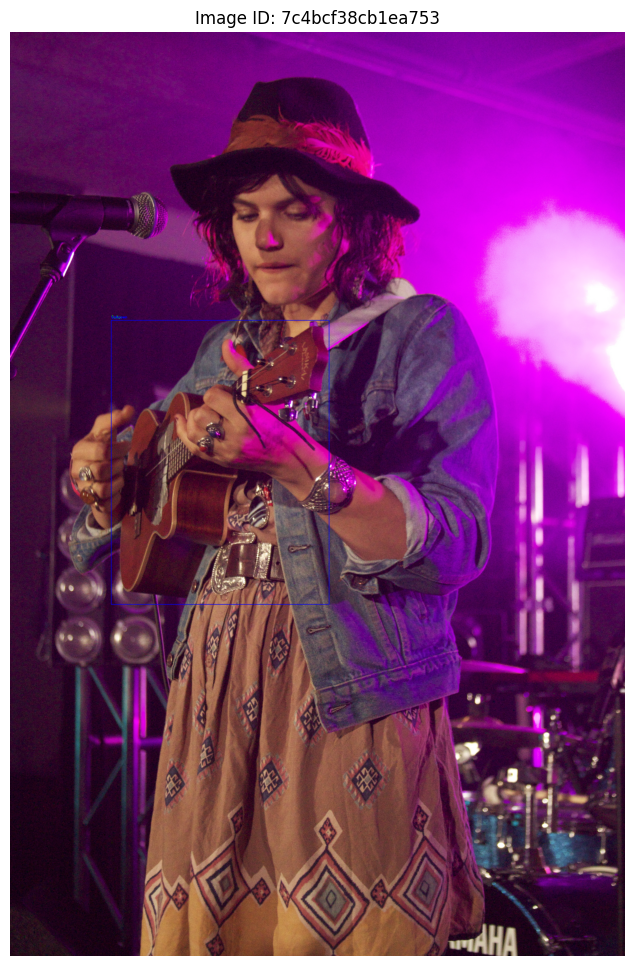


Relationships detected in the image:
- Guitar is Unknown


In [78]:
import random
import pandas as pd
import cv2
import matplotlib.pyplot as plt

def display_image_with_bboxes_and_relationships(image_id, relations_data):
    # Image path
    image_path = f"filtered_images/{image_id}.jpg"

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_id} could not be loaded. Please check the file.")
        return

    # Convert the image from BGR to RGB for proper display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter rows for the given ImageID
    filtered_data = relations_data[relations_data["ImageID"] == image_id]

    # Annotate bounding boxes and relationships on the image
    annotated_image = image.copy()
    relationships = set()
    for _, row in filtered_data.iterrows():
        # Ensure labels are strings and handle missing values
        label1 = str(row["LabelDescription1"]) if not pd.isnull(row["LabelDescription1"]) else "Unknown"
        label2 = str(row["LabelDescription2"]) if not pd.isnull(row["LabelDescription2"]) else "Unknown"
        relationship = str(row["RelationshipLabel"]) if not pd.isnull(row["RelationshipLabel"]) else "Unknown"

        # Extract bounding box coordinates for the two objects
        xmin1, xmax1 = int(row["XMin1"] * image.shape[1]), int(row["XMax1"] * image.shape[1])
        ymin1, ymax1 = int(row["YMin1"] * image.shape[0]), int(row["YMax1"] * image.shape[0])
        xmin2, xmax2 = int(row["XMin2"] * image.shape[1]), int(row["XMax2"] * image.shape[1])
        ymin2, ymax2 = int(row["YMin2"] * image.shape[0]), int(row["YMax2"] * image.shape[0])

        # Draw bounding boxes for both objects
        cv2.rectangle(annotated_image, (xmin1, ymin1), (xmax1, ymax1), (0, 255, 0), 2)  # Green for Object 1
        cv2.rectangle(annotated_image, (xmin2, ymin2), (xmax2, ymax2), (0, 0, 255), 2)  # Red for Object 2

        # Add labels
        cv2.putText(annotated_image, label1, (xmin1, ymin1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        cv2.putText(annotated_image, label2, (xmin2, ymin2 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

        # Collect relationships to display below the image
        relationships.add(f"{label1} {relationship} {label2}")

    # Display the image with bounding boxes
    plt.figure(figsize=(12, 12))
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()

    # Print relationships below the image
    print("\nRelationships detected in the image:")
    for rel in relationships:
        print(f"- {rel}")

# Load the enriched relations file
relations_data = pd.read_csv("filtered/relations_with_descriptions.csv")

# Randomly pick image IDs to visualize
random_image_ids = random.sample(list(relations_data["ImageID"].unique()), 5)

# Display images with bounding boxes and relationships for each random ImageID
for image_id in random_image_ids:
    display_image_with_bboxes_and_relationships(image_id, relations_data)


In [80]:
import pandas as pd

# Load the enriched relations dataset
relations_data = pd.read_csv("filtered/relations_with_descriptions.csv")

# Filter out rows with 'Unknown' in descriptions
filtered_data = relations_data[
    (~relations_data["LabelDescription1"].str.contains("Unknown", na=False)) &
    (~relations_data["LabelDescription2"].str.contains("Unknown", na=False)) &
    (~relations_data["RelationshipLabel"].str.contains("Unknown", na=False))
]

# Find unique ImageIDs that have valid relationships
valid_image_ids = filtered_data["ImageID"].unique()

# Create datasets for valid images
valid_images_data = pd.read_csv("filtered/re_filtered_images.csv")
valid_images_data = valid_images_data[valid_images_data["ImageID"].isin(valid_image_ids)]

valid_annotations_data = pd.read_csv("filtered/re_filtered_annotations.csv")
valid_annotations_data = valid_annotations_data[valid_annotations_data["ImageID"].isin(valid_image_ids)]

valid_relations_data = filtered_data.copy()  # Already filtered

# Save the filtered datasets
valid_images_data.to_csv("filtered/valid_images.csv", index=False)
valid_annotations_data.to_csv("filtered/valid_annotations.csv", index=False)
valid_relations_data.to_csv("filtered/valid_relations.csv", index=False)

print("Filtered datasets with valid relationships saved successfully!")


Filtered datasets with valid relationships saved successfully!


In [82]:
import pandas as pd

# Load the filtered datasets
valid_images_data = pd.read_csv("filtered/valid_images.csv")
valid_annotations_data = pd.read_csv("filtered/valid_annotations.csv")
valid_relations_data = pd.read_csv("filtered/valid_relations.csv")

# Analyze the shapes of the datasets
print("Dataset Shapes:")
print(f"Valid Images: {valid_images_data.shape}")
print(f"Valid Annotations: {valid_annotations_data.shape}")
print(f"Valid Relations: {valid_relations_data.shape}")

# General Overview
print("\nGeneral Overview:")
print(f"Valid Images Columns: {valid_images_data.columns}")
print(f"Valid Annotations Columns: {valid_annotations_data.columns}")
print(f"Valid Relations Columns: {valid_relations_data.columns}")

# Check for missing values
print("\nMissing Values:")
print(f"Valid Images: {valid_images_data.isnull().sum()}")
print(f"Valid Annotations: {valid_annotations_data.isnull().sum()}")
print(f"Valid Relations: {valid_relations_data.isnull().sum()}")

# Unique counts in each dataset
print("\nUnique Counts:")
print(f"Unique ImageIDs in Valid Images: {valid_images_data['ImageID'].nunique()}")
print(f"Unique ImageIDs in Valid Annotations: {valid_annotations_data['ImageID'].nunique()}")
print(f"Unique ImageIDs in Valid Relations: {valid_relations_data['ImageID'].nunique()}")

# Example statistics for relationships
print("\nRelationship Statistics:")
print(valid_relations_data['RelationshipLabel'].value_counts())

# Example statistics for annotations
print("\nAnnotations Statistics:")
print(valid_annotations_data['LabelName'].value_counts())


Dataset Shapes:
Valid Images: (56, 12)
Valid Annotations: (758, 13)
Valid Relations: (228, 14)

General Overview:
Valid Images Columns: Index(['ImageID', 'Subset', 'OriginalURL', 'OriginalLandingURL', 'License',
       'AuthorProfileURL', 'Author', 'Title', 'OriginalSize', 'OriginalMD5',
       'Thumbnail300KURL', 'Rotation'],
      dtype='object')
Valid Annotations Columns: Index(['ImageID', 'Source', 'LabelName', 'Confidence', 'XMin', 'XMax', 'YMin',
       'YMax', 'IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction',
       'IsInside'],
      dtype='object')
Valid Relations Columns: Index(['ImageID', 'LabelName1', 'LabelName2', 'XMin1', 'XMax1', 'YMin1',
       'YMax1', 'XMin2', 'XMax2', 'YMin2', 'YMax2', 'RelationshipLabel',
       'LabelDescription1', 'LabelDescription2'],
      dtype='object')

Missing Values:
Valid Images: ImageID               0
Subset                0
OriginalURL           0
OriginalLandingURL    0
License               0
AuthorProfileURL      0
Author     

In [84]:
valid_images_data.head()

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
0,d50284eea922ab0b,train,https://c4.staticflickr.com/6/5602/15828646371...,https://www.flickr.com/photos/johnragai/158286...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/johnragai/,John Ragai,SIC Mandarin Music Ministry | Welcoming Christ...,1887257,QB6K0ZRdbGQpla6QNe8Sfg==,https://c1.staticflickr.com/6/5602/15828646371...,0.0
1,7aa848cdcbaa2611,train,https://farm2.staticflickr.com/8572/1668444969...,https://www.flickr.com/photos/mvolek/16684449691,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/mvolek/,Miroslav Volek,"24.10.2012, Stanoviště výpravčího, Hranice na ...",394768,4wI9HLMjxakQcQhC8wwFDg==,https://c6.staticflickr.com/9/8572/16684449691...,NaN
2,05295fcdc28cb6b8,train,https://c1.staticflickr.com/1/596/20415037594_...,https://www.flickr.com/photos/girl_named_fred/...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/girl_named_fred/,Cynthia Donovan,DSC_0741,1565944,H7yf7vehpBx+ymhwfTCUxw==,https://c7.staticflickr.com/1/596/20415037594_...,0.0
3,768882c82fbcc360,train,https://farm1.staticflickr.com/7741/1732197686...,https://www.flickr.com/photos/bazzadarambler/1...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/bazzadarambler/,bazzadaramblerimages,Stroud ... opening soon.,1491776,BuD4UZhGiYXqgAq7/mqlFw==,https://c2.staticflickr.com/8/7741/17321976861...,0.0
4,d231ce948bcf205e,train,https://c7.staticflickr.com/9/8066/8232241869_...,https://www.flickr.com/photos/mdgovpics/823224...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/mdgovpics/,Maryland GovPics,Enviornmental Roundtable Discussion,4323297,hyXVZacDcJ/OvCPPbxKoTQ==,https://c5.staticflickr.com/9/8066/8232241869_...,0.0


In [85]:
valid_annotations_data.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,01cf24ea16a737d9,xclick,/m/01bl7v,1,0.181989,0.999062,0.039375,0.999375,1,1,0,0,0
1,01cf24ea16a737d9,xclick,/m/01yrx,1,0.000000,0.812383,0.548125,0.999375,0,1,0,0,0
2,01cf24ea16a737d9,xclick,/m/09j2d,1,0.332083,0.999062,0.381875,0.843125,1,1,0,0,0
3,01cf24ea16a737d9,xclick,/m/0dzct,1,0.204503,0.635084,0.171250,0.471875,0,0,0,0,0
4,0243adc3be990a12,activemil,/m/03bt1vf,1,0.878750,0.974375,0.363333,0.835833,1,0,0,0,0


In [86]:
valid_relations_data.head()

,ImageID,LabelName1,LabelName2,XMin1,XMax1,YMin1,YMax1,XMin2,XMax2,YMin2,YMax2,RelationshipLabel,LabelDescription1,LabelDescription2
0,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.823142,0.876764,0.335625,0.376250,0.823142,0.876764,0.335625,0.376250,is,Chair,NaN
1,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.442145,0.514581,0.313125,0.350625,0.442145,0.514581,0.313125,0.350625,is,Chair,NaN
2,2d490b16d2fa7572,/m/01mzpv,/m/05z87,0.473189,0.624647,0.352500,0.418750,0.473189,0.624647,0.352500,0.418750,is,Chair,NaN
3,a761bcc45abd412a,/m/01mzpv,/m/083vt,0.574264,0.950704,0.436250,0.963750,0.574264,0.950704,0.436250,0.963750,is,Chair,NaN
4,51dd3f54fff278b0,/m/07y_7,/m/083vt,0.571875,0.891875,0.276735,0.782364,0.571875,0.891875,0.276735,0.782364,is,Violin,NaN


In [87]:
import pandas as pd

# Load the enriched relations dataset
relations_data = pd.read_csv("filtered/relations_with_descriptions.csv")

# Filter out rows where LabelDescription1, LabelDescription2, or RelationshipLabel has 'Unknown' or NaN
filtered_data = relations_data[
    (~relations_data["LabelDescription1"].str.contains("Unknown", na=False)) &
    (~relations_data["LabelDescription2"].str.contains("Unknown", na=False)) &
    (~relations_data["RelationshipLabel"].str.contains("Unknown", na=False)) &
    (relations_data["LabelDescription1"].notnull()) &
    (relations_data["LabelDescription2"].notnull()) &
    (relations_data["RelationshipLabel"].notnull())
]

# Find unique ImageIDs that have valid relationships
valid_image_ids = filtered_data["ImageID"].unique()

# Create datasets for valid images
valid_images_data = pd.read_csv("filtered/re_filtered_images.csv")
valid_images_data = valid_images_data[valid_images_data["ImageID"].isin(valid_image_ids)]

valid_annotations_data = pd.read_csv("filtered/re_filtered_annotations.csv")
valid_annotations_data = valid_annotations_data[valid_annotations_data["ImageID"].isin(valid_image_ids)]

valid_relations_data = filtered_data.copy()  # Already filtered

# Save the filtered datasets
valid_images_data.to_csv("filtered/re_valid_images.csv", index=False)
valid_annotations_data.to_csv("filtered/re_valid_annotations.csv", index=False)
valid_relations_data.to_csv("filtered/re_valid_relations.csv", index=False)

print("Filtered datasets with valid relationships saved successfully!")


Filtered datasets with valid relationships saved successfully!


In [88]:
import pandas as pd

# Load the filtered datasets
valid_images_data = pd.read_csv("filtered/re_valid_images.csv")
valid_annotations_data = pd.read_csv("filtered/re_valid_annotations.csv")
valid_relations_data = pd.read_csv("filtered/re_valid_relations.csv")

# Analyze the shapes of the datasets
print("Dataset Shapes:")
print(f"Valid Images: {valid_images_data.shape}")
print(f"Valid Annotations: {valid_annotations_data.shape}")
print(f"Valid Relations: {valid_relations_data.shape}")




Dataset Shapes:
Valid Images: (34, 12)
Valid Annotations: (447, 13)
Valid Relations: (106, 14)


In [91]:
valid_images_data.head()

,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
0,d50284eea922ab0b,train,https://c4.staticflickr.com/6/5602/15828646371...,https://www.flickr.com/photos/johnragai/158286...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/johnragai/,John Ragai,SIC Mandarin Music Ministry | Welcoming Christ...,1887257,QB6K0ZRdbGQpla6QNe8Sfg==,https://c1.staticflickr.com/6/5602/15828646371...,0.0
1,768882c82fbcc360,train,https://farm1.staticflickr.com/7741/1732197686...,https://www.flickr.com/photos/bazzadarambler/1...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/bazzadarambler/,bazzadaramblerimages,Stroud ... opening soon.,1491776,BuD4UZhGiYXqgAq7/mqlFw==,https://c2.staticflickr.com/8/7741/17321976861...,0.0
2,d231ce948bcf205e,train,https://c7.staticflickr.com/9/8066/8232241869_...,https://www.flickr.com/photos/mdgovpics/823224...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/mdgovpics/,Maryland GovPics,Enviornmental Roundtable Discussion,4323297,hyXVZacDcJ/OvCPPbxKoTQ==,https://c5.staticflickr.com/9/8066/8232241869_...,0.0
3,01cf24ea16a737d9,train,https://c2.staticflickr.com/3/2852/9203684866_...,https://www.flickr.com/photos/bortescristian/9...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/bortescristian/,Cristian Bortes,Smaranda & Arpagic,14519028,DtXfA2gBw2LhrsPc4WMRFw==,https://c5.staticflickr.com/3/2852/9203684866_...,0.0
4,09658363ba00992d,train,https://c6.staticflickr.com/8/7340/11051801086...,https://www.flickr.com/photos/marniejoyce/1105...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/marniejoyce/,Marnie Joyce,20100409tedleo083,330181,cKI2A7Dlb9Z4+rjkINXuvA==,https://c4.staticflickr.com/8/7340/11051801086...,0.0


In [92]:
valid_relations_data.head()

,ImageID,LabelName1,LabelName2,XMin1,XMax1,YMin1,YMax1,XMin2,XMax2,YMin2,YMax2,RelationshipLabel,LabelDescription1,LabelDescription2
0,d81a15f4e268e714,/m/04yx4,/m/04bcr3,0.537500,0.740625,0.373333,0.850833,0.000000,0.716875,0.656667,0.827500,at,Man,Table
1,5058ce5ed268362b,/m/04yx4,/m/01y9k5,0.072266,0.519531,0.005865,0.998534,0.161133,0.787109,0.837243,0.998534,at,Man,Desk
2,ec1dfcc44008149a,/m/01mzpv,/m/04bcr3,0.256250,0.440000,0.336667,0.569167,0.056250,0.971875,0.499167,0.984167,at,Chair,Table
3,d50284eea922ab0b,/m/04yx4,/m/026t6,0.626250,0.706250,0.625000,0.836667,0.628125,0.741250,0.811667,0.985833,plays,Man,Drum
4,be8304b6b0699dd9,/m/04yx4,/m/04bcr3,0.091875,0.153750,0.347092,0.654784,0.134375,0.353125,0.472795,0.557223,at,Man,Table


In [94]:
import pandas as pd

# Load the dataset
valid_images_data = pd.read_csv("filtered/valid_images.csv")

# Keep only the specified columns
valid_images_data = valid_images_data[["ImageID", "OriginalURL", "OriginalLandingURL"]]

# Save the updated dataset
valid_images_data.to_csv("filtered/valid_images_trimmed.csv", index=False)

print("Trimmed valid_images_data saved successfully!")


Trimmed valid_images_data saved successfully!


In [95]:
valid_images_data.shape

(56, 3)